In [8]:
using CSV
using DataFrames
using Turing
using Distributions
using MCMCChains, Plots, StatsPlots
using Random:seed! # to set seed
using Statistics
using StatsFuns: logistic
using LazyArrays
using Suppressor
seed!(1)

MersenneTwister(1)

# Question 1
The posterior distribution for difference in mean blood percentages between those clamped early (procedure 1) and those not clamped until the placenta began to descend (procedure 2) has mean -2.45859	(95% HDI: -3.94466, -0.944554). The 95% HDI contains 0, supporting that the mean blood percentage for procedure 1 is smaller than for procedure 2.


In [2]:
@model function equality(x1, x2)
    alpha1 ~ Gamma(0.001, 1/0.001)
    alpha2 ~ Gamma(0.001, 1/0.001)
    beta1 ~ Gamma(0.001, 1/0.001)
    beta2 ~ Gamma(0.001, 1/0.001)
    x1 ~ Gamma(alpha1, 1/beta1)
    x2 ~ Gamma(alpha2, 1/beta2)
    mu1 = alpha1/beta1
    mu2 = alpha2/beta2
    mudiff = mu1-mu2
    return mudiff
    
end

equality (generic function with 2 methods)

In [8]:
q1 = DataFrame(CSV.File("babies.csv"))
# describe(q1)
model = equality(q1.x, q1.y)
chain = sample(model,  NUTS(), MCMCThreads(), 10_000, 4);

In [10]:
gelmandiag(chain)

Gelman, Rubin, and Brooks diagnostic
  parameters      psrf    psrfci 
      Symbol   Float64   Float64 

      alpha1    1.0000    1.0001
      alpha2    1.0003    1.0006
       beta1    1.0000    1.0002
       beta2    1.0003    1.0005


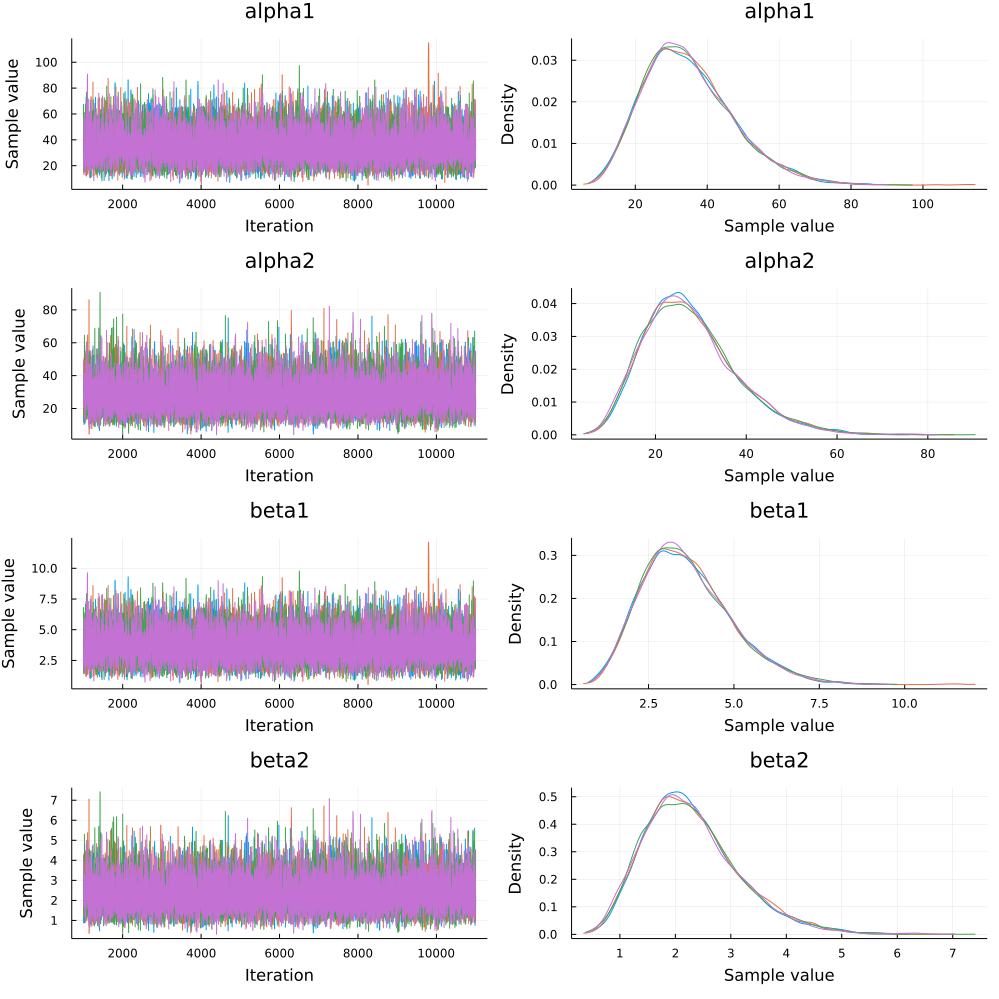

In [11]:
plot(chain)

In [12]:
# Extract mudiff
mudiff = generated_quantities(model, chain)
mudiff = mudiff[:]
df = DataFrame(:mean => mean(mudiff), :lb =>hdi(mudiff, 0.95)[1], :ub =>hdi(mudiff, 0.95)[2])

,mean,lb,ub
,Float64,Float64,Float64
1,-2.45859,-3.94466,-0.944554


# Question 2

The probability that a female wolf with measures x3 = 5.28 and x7 = 1.78, comes from Arctic habitat is 0.5028666905953311.

In [9]:
q2 = DataFrame(CSV.File("wolves.csv"))
describe(q2)

,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Real,Float64,Real,Int64,DataType
1,arctic,0.64,0,1.0,1,0,Int64
2,gender,0.36,0,0.0,1,0,Int64
3,x3,5.5172,4.92,5.55,5.98,0,Float64
4,x7,1.8272,1.6,1.83,2.07,0,Float64


In [13]:
@model function logisticreg(X, y; predictors=size(X, 2))
    α ~ Normal(0, 10)
    β ~ filldist(Normal(0, 100), predictors)

    y ~ arraydist(LazyArray(@~ BernoulliLogit.(α .+ X * β)))
end

X = Matrix(q2[:, Not(:arctic)])
y = q2[:, :arctic]

model = logisticreg(X, y)
chain = sample(model, NUTS(), MCMCThreads(), 10_000, 4)

┌ Warning: Only a single thread available: MCMC chains are not sampled in parallel
└ @ AbstractMCMC /Users/aaron/.julia/packages/AbstractMCMC/BPJCW/src/sample.jl:291
┌ Info: Found initial step size
│   ϵ = 3.2
└ @ Turing.Inference /Users/aaron/.julia/packages/Turing/y0DW3/src/inference/hmc.jl:188
┌ Info: Found initial step size
│   ϵ = 1.6
└ @ Turing.Inference /Users/aaron/.julia/packages/Turing/y0DW3/src/inference/hmc.jl:188
┌ Info: Found initial step size
│   ϵ = 1.6
└ @ Turing.Inference /Users/aaron/.julia/packages/Turing/y0DW3/src/inference/hmc.jl:188
┌ Info: Found initial step size
│   ϵ = 3.2
└ @ Turing.Inference /Users/aaron/.julia/packages/Turing/y0DW3/src/inference/hmc.jl:188
Sampling (1 threads): 100%|█████████████████████████████| Time: 0:00:21


Chains MCMC chain (10000×16×4 Array{Float64, 3}):

Iterations        = 1001:1:11000
Number of chains  = 4
Samples per chain = 10000
Wall duration     = 30.68 seconds
Compute duration  = 30.25 seconds
parameters        = α, β[2], β[3], β[1]
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters       mean       std   naive_se      mcse          ess      rhat  ⋯
      Symbol    Float64   Float64    Float64   Float64      Float64   Float64  ⋯

           α    -5.1443    8.0897     0.0404    0.0633   17253.5221    1.0003  ⋯
        β[1]     1.4155    1.2263     0.0061    0.0096   16348.7635    1.0001  ⋯
        β[2]     7.2965    3.2211     0.0161    0.0298   11670.0967    1.0001  ⋯
        β[3]   -19.0043    8.2255     0.0411    0.0716   13388.9599    1.0001  ⋯
                                                 

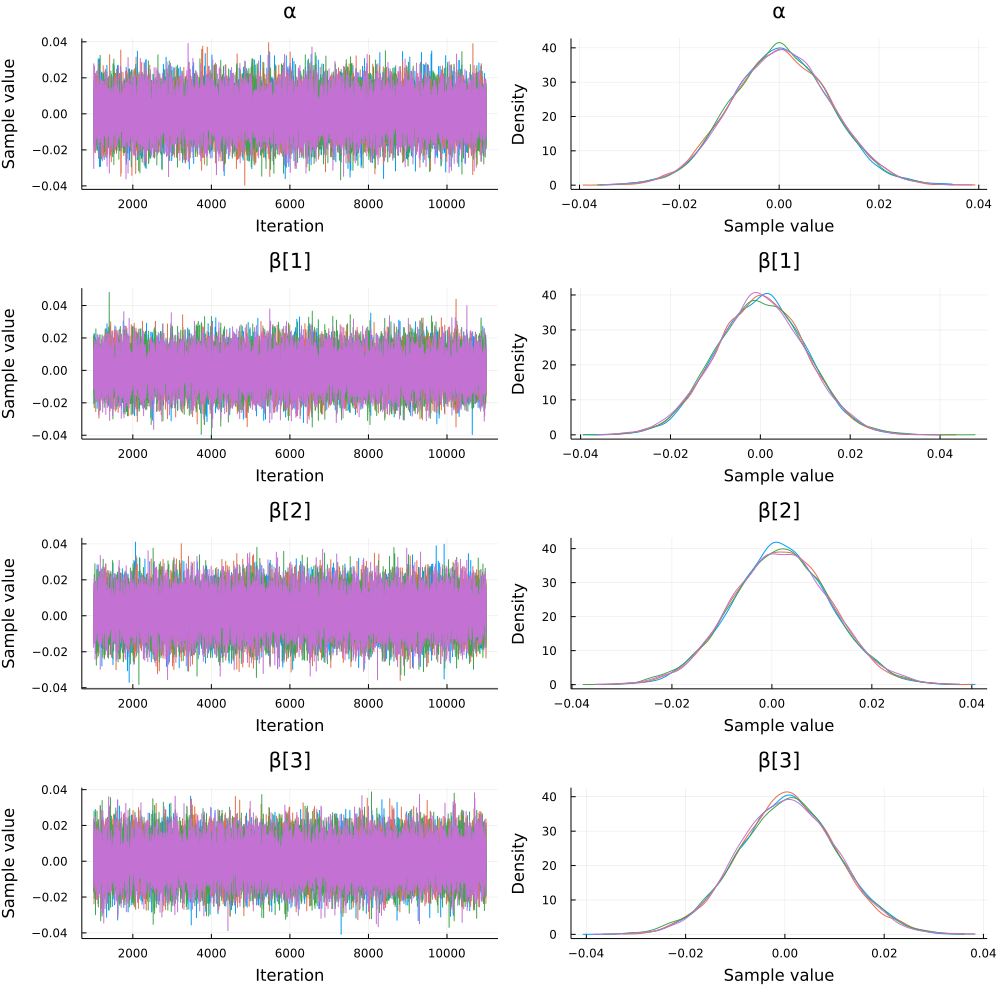

In [15]:
plot(chain)

In [14]:
function prediction(x::Matrix, chain)
    summaries, quantiles = describe(chain)
    coefs = summaries[:, :mean]

    # Retrieve the number of rows.
    n, _ = size(x)

    # Generate a vector to store our predictions.
    v = Vector{Float64}(undef, n)

    # Calculate the logistic function for each element in the test set.
    for i in 1:n
        
        num = logistic(coefs[1] + sum(x_pred[i,:].*coefs[2:length(coefs)]))
        v[i] = num
        
    end
    return v
end;

x_pred = Matrix(reshape([1, 5.28, 1.78], 1,3))

# Make the predictions.
predictions = prediction(x_pred, chain)

1-element Vector{Float64}:
 0.7249557664695061

# Question 3

## a. Poisson model for the problem:

I set an uninformative prior for all coefficient as Normal distribution N(0, 10)

In [17]:
q3 = DataFrame(CSV.File("micronuclei.csv"))
describe(q3)

,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Real,Float64,Real,Int64,DataType
1,x,1.75,0.0,1.5,4.0,0,Float64
2,y,0.303,0,0.0,6,0,Int64


In [18]:
@model function poissonreg(x, y, σ²; n= size(x,1))
    β ~ filldist(Normal(0, σ²), 2)
    
    for i = 1:n
        y[i] ~ LogPoisson(β[1] + β[2]*x[i])
    end
end

model = poissonreg(q3.x, q3.y, 10)
chain = sample(model, NUTS(), MCMCThreads(), 6_000, 4)


Chains MCMC chain (6000×14×4 Array{Float64, 3}):

Iterations        = 1001:1:7000
Number of chains  = 4
Samples per chain = 6000
Wall duration     = 64.92 seconds
Compute duration  = 64.5 seconds
parameters        = β[1], β[2]
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std   naive_se      mcse         ess      rhat    ⋯
      Symbol   Float64   Float64    Float64   Float64     Float64   Float64    ⋯

        β[1]   -2.8137    0.0633     0.0004    0.0009   5426.4735    1.0004    ⋯
        β[2]    0.6709    0.0196     0.0001    0.0003   5428.6900    1.0004    ⋯
                                                                1 column omitted

Quantiles
  parameters      2.5%     25.0%     50.0%     75.0%     97.5% 
      Symbol   Float64   Float64   Float64   Float64   Float64 

   

In [19]:
# Gelman Diagnostics: PSRF coefficients are close to 1, indicating good fit
gelmandiag(chain)

Gelman, Rubin, and Brooks diagnostic
  parameters      psrf    psrfci 
      Symbol   Float64   Float64 

        β[1]    1.0005    1.0010
        β[2]    1.0006    1.0013


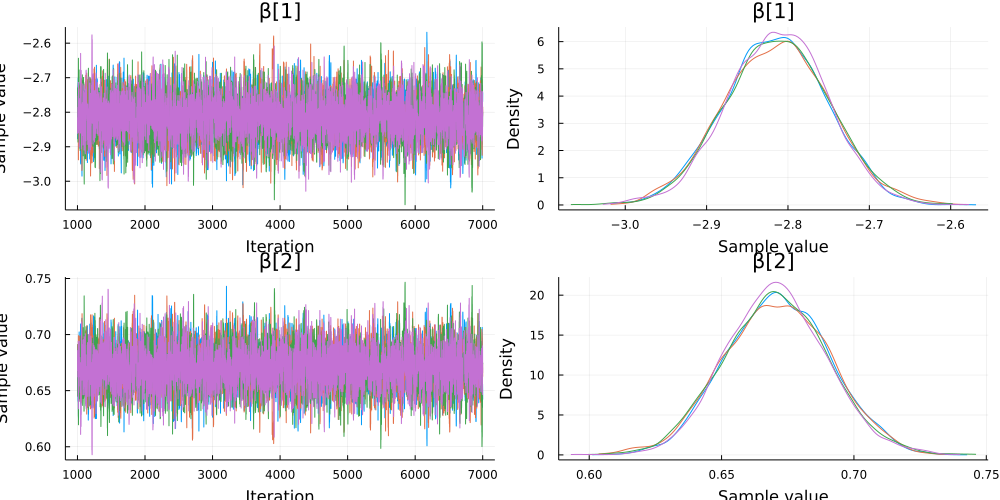

In [20]:
plot(chain)

## b. The average number of micronuclei fpr dose of 3.5 Gy is  0.6277056540217703

In [21]:
function poission_prediction(x::Matrix, chain)
    summaries, quantiles = describe(chain)
    coefs = summaries[:, :mean]

    # Retrieve the number of rows.
    n, _ = size(x)

    # Generate a vector to store our predictions.
    v = Vector{Float64}(undef, n)

    # Calculate the logistic function for each element in the test set.
    for i in 1:n
        
        num = exp(sum(coefs[1] + coefs[2]*x[i]))
        v[i] = num
        
    end
    return v
end;

x_pred = Matrix(reshape([3.5], 1, 1))

# Make the predictions.
predictions = poission_prediction(x_pred, chain)

1-element Vector{Float64}:
 0.6277056540217703